# STAT 301 Project: Individual EDA & Planning

Aidan Meharg: 20112579

July 26, 2025

### Overview

This report covers an initial exploratory data analysis of Airbnb listing data for UBC STAT 301. A description of the data is given in section 1, followed by questions of interest and exploratory analysis in sections 2 and 3. A proposed model is provided in section 4.

In [42]:
# import required packages
library(tidyverse)

## 1. Data Description

In this project we will be working with data on Airbnb listing prices in European cities. Airbnb is one of the world's leading vacation home rental services, with over 8 million active listings as of July 26, 2025.

The provided dataset for this project was sourced from [kaggle](https://www.kaggle.com/datasets/thedevastator/airbnb-prices-in-european-cities), and the data was originally collected as part of an [econometrics study](https://www.sciencedirect.com/science/article/pii/S0261517721000388?via%3Dihub) by Kristóf Gyódi and Łukasz Nawaro. Data was collected for several popular European cities and split into tables by weekend or weekday listings. In our report we will focus on **London**, **Rome**, and **Budapest** during both weekday and weekend listing times.

The full list of variables are provided below, as described in the [original research study](https://zenodo.org/records/4446043#.Y9Y9ENJBwUE):

| **Variable**                 | **Description**                                                                 |
|-----------------------------|---------------------------------------------------------------------------------|
| `realSum`                   | Full price of accommodation for two people and two nights (in EUR)             |
| `room_type`                 | Type of the accommodation                                                      |
| `room_shared`               | Dummy variable indicating if the room is shared                                |
| `room_private`              | Dummy variable indicating if the room is private                               |
| `person_capacity`           | Maximum number of guests allowed                                               |
| `host_is_superhost`         | Dummy variable indicating if the host is a superhost                           |
| `multi`                     | Dummy variable indicating if the host has 2–4 listings                         |
| `biz`                       | Dummy variable indicating if the host has more than 4 listings                 |
| `cleanliness_rating`        | Cleanliness rating of the listing                                              |
| `guest_satisfaction_overall`| Overall rating of the listing                                                  |
| `bedrooms`                  | Number of bedrooms (0 for studios)                                             |
| `dist`                      | Distance from the city centre (in km)                                          |
| `metro_dist`                | Distance from the nearest metro station (in km)                                |
| `attr_index`                | Attraction index of the listing location                                       |
| `attr_index_norm`           | Normalised attraction index (0–100)                                            |
| `rest_index`                | Restaurant index of the listing location                                       |
| `rest_index_norm`           | Normalised restaurant index (0–100)                                            |
| `lng`                       | Longitude of the listing location                                              |
| `lat`                       | Latitude of the listing location  


### 1.1 Load dataset

The original data was comprised of several tables, one for each city and further split by weekday/weekend. These csv tables were uploaded to our shared GitHub repository, and aggregated into a comprehensive dataset by adding 2 additional variables: 
- **city**: 3 level factor indicating which city the listing was in (budapest baseline, london, rome) 
- **weekend**: binary variable indicating whether listing was for weekday (False) or weekend (True)

In addition, I note that the variables `multi` and `biz` both refer to the number of listings offered by the host. These should be treated as 2 levels of a 3 level factor variable, which is handled below by adding the following:
- **host_listings**: 3 level factor with levels: `1listing`, `2–4listings`, `>4listings`

After joining all required tables together, we have a dataset with 23,042 observations and 21 columns. This can be seen in the output of `glimpse()`, along with variable data types.

In [16]:
# Merge the datasets from the Github repository
base_url <- "https://raw.githubusercontent.com/NathanPalaiologos/STAT-301-Project/main/raw_data/"

# List of CSV files in the directory
cities <- c("budapest", "london", "rome")
file_names <- c(paste0(cities, "_weekdays.csv"), paste0(cities, "_weekends.csv"))

# Read all CSV files into a list
data_list <- lapply(file_names, function(file_name) {
    # Read the CSV file
    data <- suppressMessages(read_csv(paste0(base_url, file_name), show_col_types = FALSE))
    
    # Extract city and weekend information from the filename
    city <- str_extract(file_name, "^[^_]+")
    weekend <- str_detect(file_name, "weekends")
    
    # Add new columns
    data <- data %>%
        mutate(city = city, weekend = weekend)
    
    return(data)
})

# Combine all datasets into one
airbnb <- bind_rows(data_list) |>
    select(-...1)

head(airbnb)
glimpse(airbnb)

realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,weekend
<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>
238.9905,Entire home/apt,FALSE,FALSE,6,TRUE,0,1,10,99,⋯,0.3593550,0.3526430,404.4047,24.116552,893.4773,67.65685,19.05074,47.50076,budapest,FALSE
300.7943,Entire home/apt,FALSE,FALSE,6,FALSE,0,1,9,98,⋯,0.9294272,0.2002355,1676.8760,100.000000,452.5397,34.26770,19.04493,47.50405,budapest,FALSE
162.3819,Entire home/apt,FALSE,FALSE,4,TRUE,0,0,10,98,⋯,2.4508403,0.2794518,163.5885,9.755551,191.9923,14.53825,19.02170,47.49882,budapest,FALSE
118.4377,Entire home/apt,FALSE,FALSE,2,FALSE,0,0,9,92,⋯,1.5594494,0.4779711,191.7198,11.433155,326.2156,24.70205,19.06301,47.51126,budapest,FALSE
134.4174,Entire home/apt,FALSE,FALSE,4,TRUE,1,0,10,99,⋯,1.1138030,0.2701016,198.6035,11.843658,635.5159,48.12322,19.06900,47.49900,budapest,FALSE
127.3676,Entire home/apt,FALSE,FALSE,4,FALSE,1,0,9,91,⋯,0.2684703,0.1669317,635.6350,37.905903,1005.6535,76.15118,19.05480,47.50094,budapest,FALSE


Rows: 23,042
Columns: 21
$ realSum                    <dbl> 238.99046, 300.79428, 162.38191, 118.43775,…
$ room_type                  <chr> "Entire home/apt", "Entire home/apt", "Enti…
$ room_shared                <lgl> FALSE, FALSE, FALSE, FALSE, FALSE, FALSE, F…
$ room_private               <lgl> FALSE, FALSE, FALSE, FALSE, FALSE, FALSE, F…
$ person_capacity            <dbl> 6, 6, 4, 2, 4, 4, 4, 4, 6, 4, 3, 4, 5, 6, 4…
$ host_is_superhost          <lgl> TRUE, FALSE, TRUE, FALSE, TRUE, FALSE, FALS…
$ multi                      <dbl> 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0…
$ biz                        <dbl> 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1…
$ cleanliness_rating         <dbl> 10, 9, 10, 9, 10, 9, 6, 9, 10, 10, 10, 10, …
$ guest_satisfaction_overall <dbl> 99, 98, 98, 92, 99, 91, 80, 92, 88, 96, 100…
$ bedrooms                   <dbl> 1, 2, 1, 1, 2, 2, 2, 1, 2, 1, 0, 1, 2, 2, 0…
$ dist                       <dbl> 0.3593550, 0.9294272, 2.4508403, 1.5594494,…
$ metro_dist   

In [17]:
# Change variables to appropriate data types
airbnb <- airbnb |>
    mutate(city = factor(city),
          host_listings = case_when(
          multi == 1 ~ "2–4listings",
          biz == 1 ~ ">4listings",
          TRUE ~ "1listing"
        ),
        host_listings = factor(host_listings, levels = c("1listing", "2–4listings", ">4listings"))
    )

levels(airbnb$host_listings)
levels(airbnb$city)

[1] "1listing"    "2–4listings" ">4listings"

[1] "budapest" "london"   "rome"

## 2. Exploratory Question

The provided Airbnb dataset provides a wealth of variables, and the opportunity to explore many questions of interest. The collected data and surrounding research suggests using the price of accommodation (realSum) as the response variable. I will follow in this vein.

One relationship that I am interested in exploring is between listing price (`realSum`) and the distance of the property from amenities and attractions, specifically distance to city center (`dist`) and to nearest metro station (`metro_dist`).

I would also like to explore whether there are significant differences in price between the chosen cities, and whether weekend listings are priced significantly differently than weekdays.

In order to explore the relationship between `realSum` and `dist`, `metro_dist`, `city`, `weekend`, I will propose a linear model in section 4.

Given that this course emphasizes a focus on (relatively) simple linear regression models, my chosen question is grounded in inferential curiosity. If prediction was the main goal, I would likely choose to utililize some slightly more complex (albeit less interpretable) machine learning models to predict accomodation price as accurately as possible on out-of-sample data.

## 3. Exploratory Data Analysis and Visualization

In [18]:
# select variables relevant to the research question
airbnb <- airbnb |>
    select(realSum, dist, metro_dist, city, weekend)

# summary table of our chosen variables
summary(airbnb)

head(airbnb)

    realSum              dist            metro_dist              city     
 Min.   :   34.78   Min.   : 0.03466   Min.   : 0.002301   budapest:4022  
 1st Qu.:  144.05   1st Qu.: 1.90915   1st Qu.: 0.296980   london  :9993  
 Median :  195.92   Median : 3.32148   Median : 0.500256   rome    :9027  
 Mean   :  268.47   Mean   : 3.82275   Mean   : 0.852223                  
 3rd Qu.:  296.57   3rd Qu.: 5.15524   3rd Qu.: 1.030199                  
 Max.   :15499.89   Max.   :19.25041   Max.   :11.687734                  
  weekend       
 Mode :logical  
 FALSE:11180    
 TRUE :11862    
                
                
                

realSum,dist,metro_dist,city,weekend
<dbl>,<dbl>,<dbl>,<fct>,<lgl>
238.9905,0.3593550,0.3526430,budapest,FALSE
300.7943,0.9294272,0.2002355,budapest,FALSE
162.3819,2.4508403,0.2794518,budapest,FALSE
118.4377,1.5594494,0.4779711,budapest,FALSE
134.4174,1.1138030,0.2701016,budapest,FALSE
127.3676,0.2684703,0.1669317,budapest,FALSE


stat
<int>
77


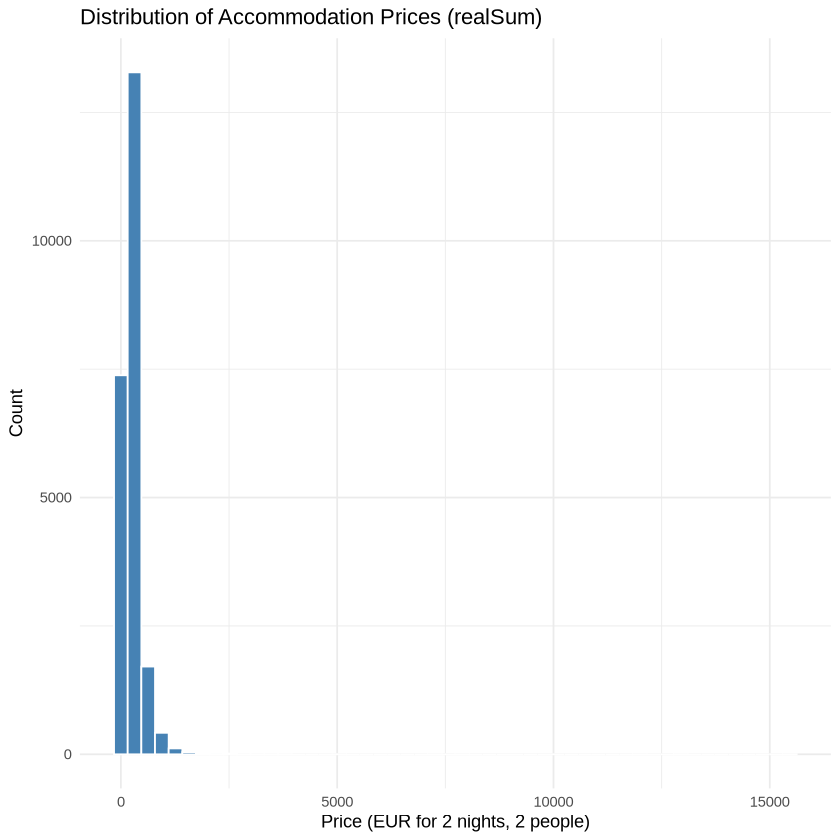

In [29]:
# distribution of realSum
ggplot(airbnb, aes(x = realSum)) +
  geom_histogram(bins = 50, fill = "steelblue", color = "white") +
  labs(title = "Distribution of Accommodation Prices (realSum)",
       x = "Price (EUR for 2 nights, 2 people)", y = "Count") +
  theme_minimal()

airbnb |> filter(realSum > 2000) |> summarize(stat = n())

From both the summary table, and the above histogram I note that there are some extreme price outliers. These will likely prove problematic for model fits and parameter estimation. There are only 77 listings (out of the 23042 total) that exceed 2000 Euros per 2 nights. These outliers are likely luxury listings, data entry errors, or special cases like event rentals that should not be compared with the majority of listings in this exploration.

I will proceed by dropping extreme outliers that exceed 2000 Euros, and we will likely need to investigate this issue further in our full report. 

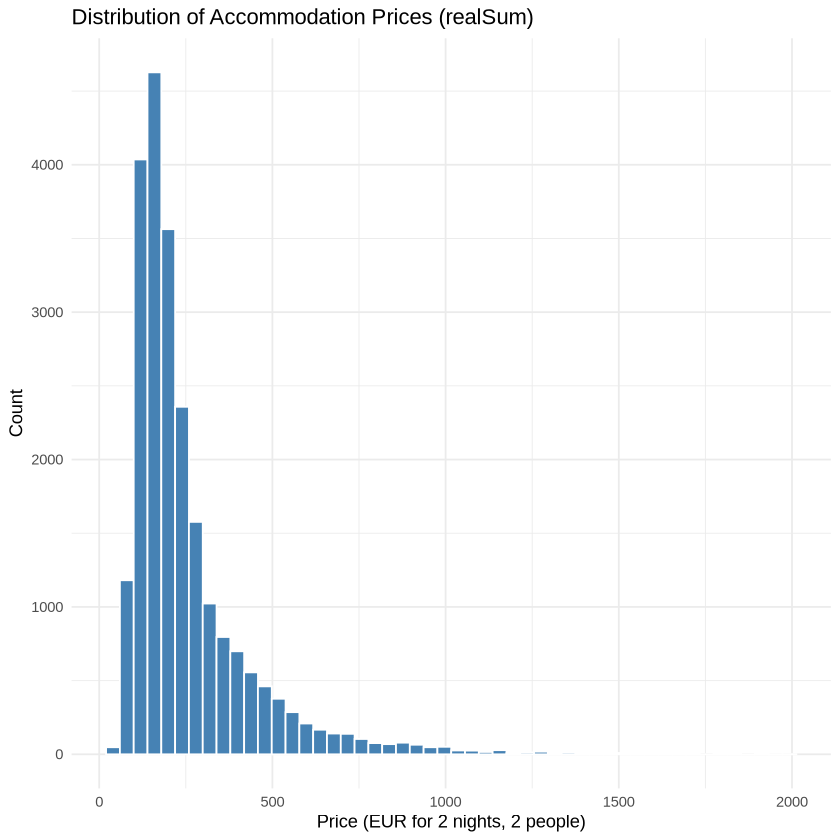

In [49]:
# Drop extreme price outliers
airbnb <- airbnb |> filter(realSum < 2000)

# Plot the price distribution again
ggplot(airbnb, aes(x = realSum)) +
  geom_histogram(bins = 50, fill = "steelblue", color = "white") +
  labs(title = "Distribution of Accommodation Prices (realSum)",
       x = "Price (EUR for 2 nights, 2 people)", y = "Count") +
  theme_minimal()

[1] 0.6221659

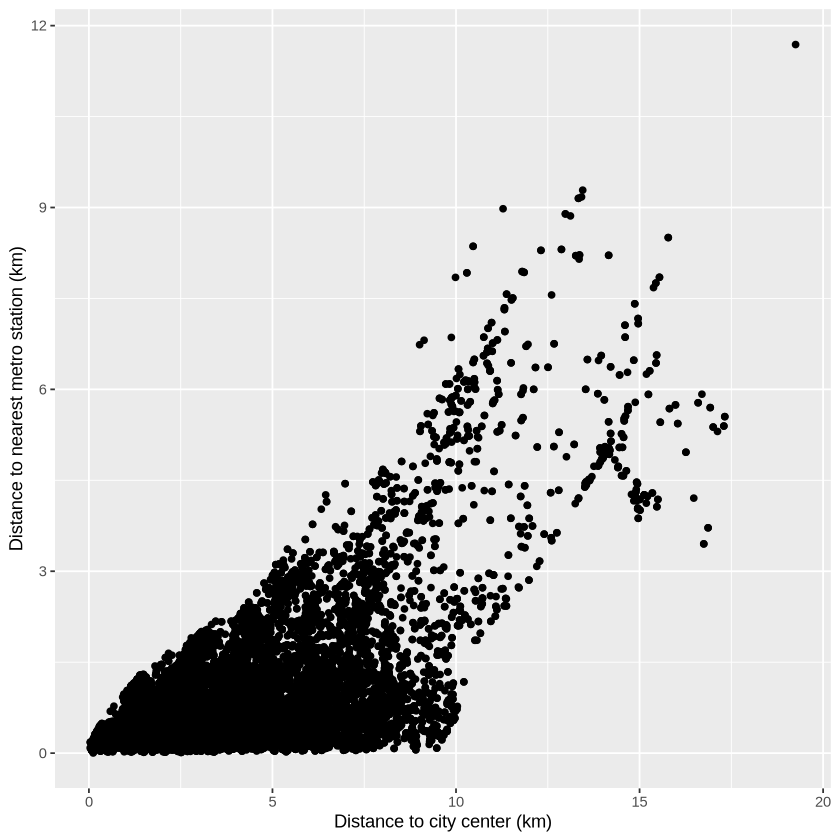

In [41]:
# inspect correlation between distance to city center and distance to metro
ggplot(airbnb, aes(dist, metro_dist)) +
    geom_point() +
    xlab("Distance to city center (km)") + 
    ylab("Distance to nearest metro station (km)")

cor(airbnb$dist, airbnb$metro_dist)

I notice a moderately strong correlation between distance to city center and distance to nearest metro. This will be kept in mind when fitting models. Multicollinearity can lead to unstable parameter estimates, and inflated standard errors which will hurt inference.

In addition, even after removing the most extreme outliers, the general spread of the response may warrant a transformation of the response variable. Log or square root transformations may be acceptable, and will be investigated in the final report.

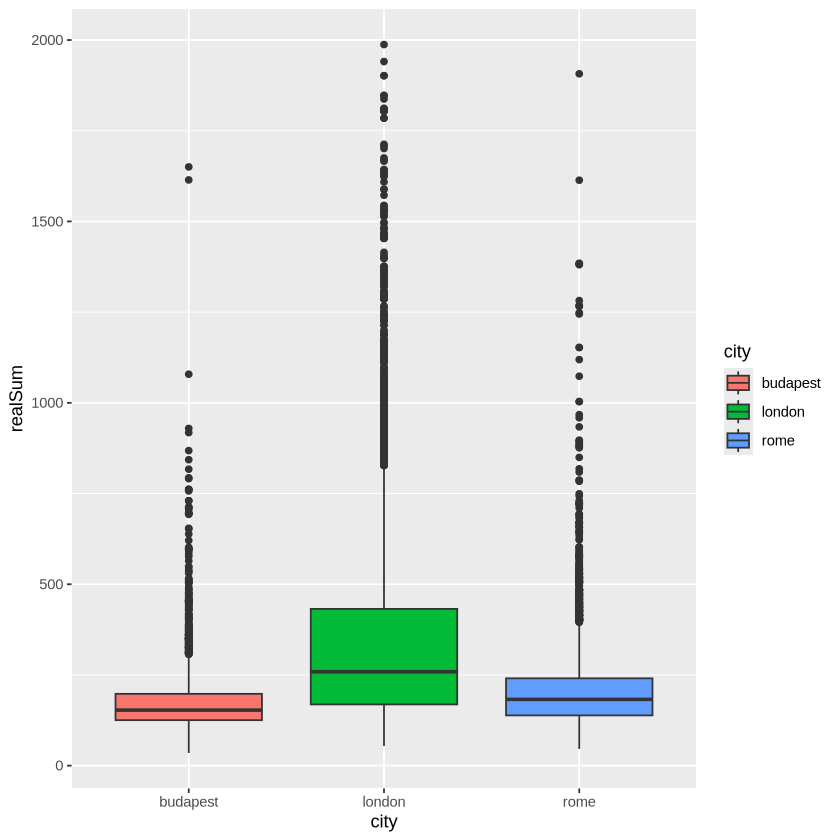

In [47]:
# price distribution across cities
ggplot(airbnb, aes(city, realSum)) +
    geom_boxplot(aes(fill = city))

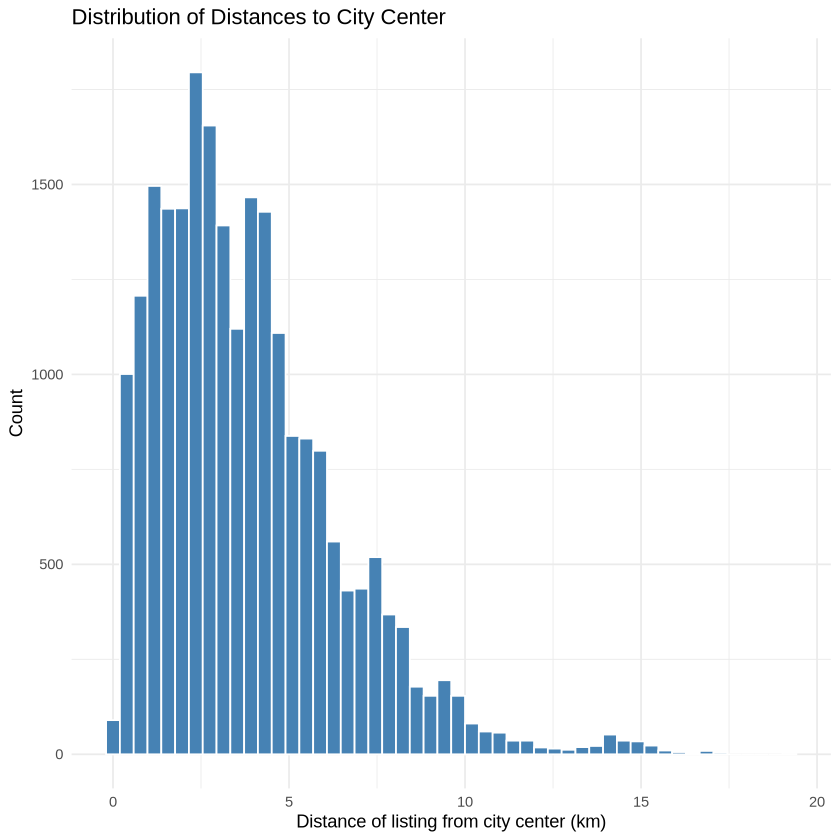

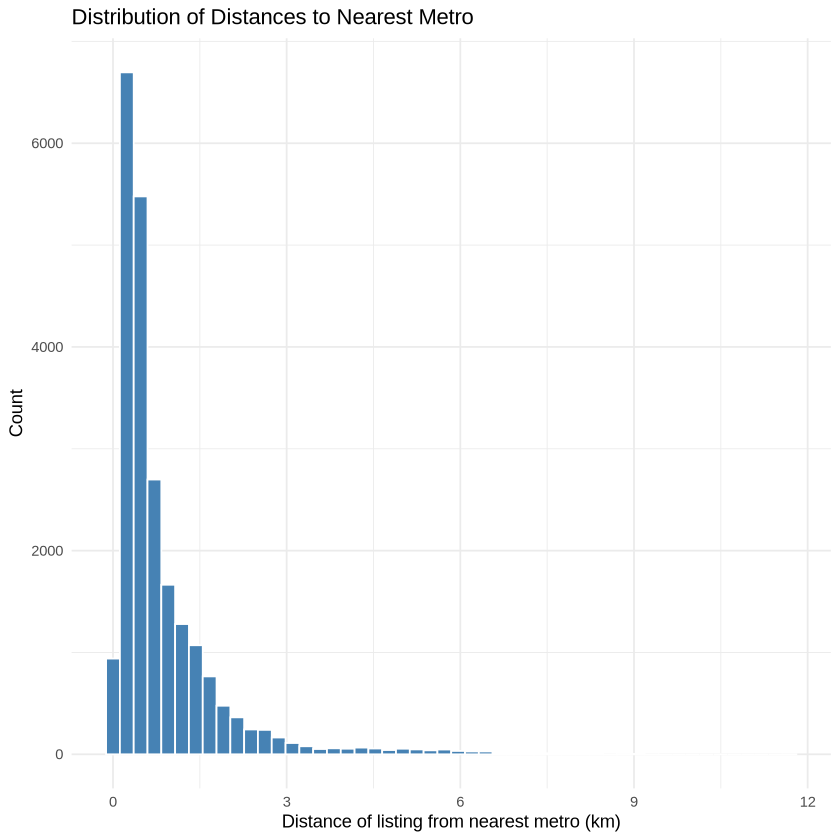

In [52]:
# Distribution of city center distances
ggplot(airbnb, aes(x = dist)) +
  geom_histogram(bins = 50, fill = "steelblue", color = "white") +
  labs(title = "Distribution of Distances to City Center",
       x = "Distance of listing from city center (km)", y = "Count") +
  theme_minimal()

# Distribution of metro distances
ggplot(airbnb, aes(x = metro_dist)) +
  geom_histogram(bins = 50, fill = "steelblue", color = "white") +
  labs(title = "Distribution of Distances to Nearest Metro",
       x = "Distance of listing from nearest metro (km)", y = "Count") +
  theme_minimal()

## 4. Methods and Plan

I plan to fit an additive linear model to investigate the relationships of interest. The model will take the form:

$$
\text{realSum}_i = \beta_0 + \beta_1 \cdot \text{dist}_i + \beta_2 \cdot \text{metro\_dist}_i + \beta_3 \cdot \text{weekend}_i + \sum_{j=1}^{J-1} \gamma_j \cdot \text{city}_{ij} + \varepsilon_i
$$

where the variables for observation $i$ are as described in previous sections, and $\varepsilon_i$ are assumed to be independent and identically distributed normal random variables with mean 0 and constant variance $\sigma ^2$.

Interaction terms may be of interest in the future, however the initial focus would be on main effects. This would require assumptions that interaction effects are negligible, for example we may assume that the association between `realSum` and `dist` is the same across different cities, or the same on weekends/weekdays.

The extreme outliers, and general spread of the response may warrant a transformation of the response variable. This will be investigated in the final report.

## References

- About Us. Airbnb Newsroom. (2025, May 13). https://news.airbnb.com/about-us/ 

- Devastator. (n.d.). Airbnb Prices in European Cities. Kaggle. Retrieved from https://www.kaggle.com/datasets/thedevastator/airbnb-prices-in-european-cities/data

- Gyódi, K., & Nawaro, Ł. (2021). Determinants of airbnb prices in European cities: A spatial econometrics approach. Tourism Management, 86, 104319. https://doi.org/10.1016/j.tourman.2021.104319 
